In [2]:
import os
from pathlib import Path
import random

import matplotlib.pyplot as plt
from PIL import Image
import numpy as np


In [3]:
# Configuracion del dataset COCO
SPLIT = "train"  # Cambia a "valid" o "test" cuando quieras
PROJECT_ROOT = Path.cwd()

DATA_ROOT_CANDIDATES = [
    PROJECT_ROOT / "guns-knives-coco" / "guns-knives-coco",
    PROJECT_ROOT / "guns-knives-coco",
    Path(r"C:\Users\LENOVO\Documents\Stealth\guns-knives-coco\guns-knives-coco"),
]

DATA_ROOT = next((p for p in DATA_ROOT_CANDIDATES if (p / SPLIT).exists()), None)
if DATA_ROOT is None:
    raise FileNotFoundError(
        "No se encontro la raiz del dataset. Verifica la carpeta guns-knives-coco."
    )

SPLIT_DIR = DATA_ROOT / SPLIT
ANNOTATIONS_PATH = SPLIT_DIR / "_annotations.coco.json"

print("DATA_ROOT:", DATA_ROOT)
print("SPLIT_DIR:", SPLIT_DIR)
print("ANNOTATIONS_PATH:", ANNOTATIONS_PATH)
print("Anotaciones existe:", ANNOTATIONS_PATH.exists())

DATA_ROOT: c:\Users\LENOVO\Documents\Stealth\guns-knives-coco\guns-knives-coco
SPLIT_DIR: c:\Users\LENOVO\Documents\Stealth\guns-knives-coco\guns-knives-coco\train
ANNOTATIONS_PATH: c:\Users\LENOVO\Documents\Stealth\guns-knives-coco\guns-knives-coco\train\_annotations.coco.json
Anotaciones existe: True


In [4]:
import json
from collections import defaultdict

with open(ANNOTATIONS_PATH, "r", encoding="utf-8") as f:
    coco = json.load(f)

images = coco.get("images", [])
annotations = coco.get("annotations", [])
categories = coco.get("categories", [])

category_by_id = {c["id"]: c["name"] for c in categories}
image_by_id = {img["id"]: img for img in images}
anns_by_image_id = defaultdict(list)

for ann in annotations:
    anns_by_image_id[ann["image_id"]].append(ann)

def resolve_image_path(img_info):
    # En este dataset, normalmente file_name es relativo al split (train/valid/test).
    p = SPLIT_DIR / img_info["file_name"]
    if p.exists():
        return p

    # Fallback por si file_name ya viene con subcarpetas o ruta distinta.
    p_alt = DATA_ROOT / img_info["file_name"]
    if p_alt.exists():
        return p_alt

    return p

missing_files = [
    img["file_name"]
    for img in images
    if not resolve_image_path(img).exists()
]

valid_image_ids = [
    img["id"]
    for img in images
    if resolve_image_path(img).exists()
]

print("Imagenes (json):", len(images))
print("Anotaciones:", len(annotations))
print("Categorias:", category_by_id)
print("Imagenes encontradas en disco:", len(valid_image_ids))
print("Imagenes faltantes:", len(missing_files))
if missing_files:
    print("Ejemplo faltante:", missing_files[0])

Imagenes (json): 4409
Anotaciones: 5110
Categorias: {0: 'weapon', 1: 'knife', 2: 'pistol'}
Imagenes encontradas en disco: 4409
Imagenes faltantes: 0


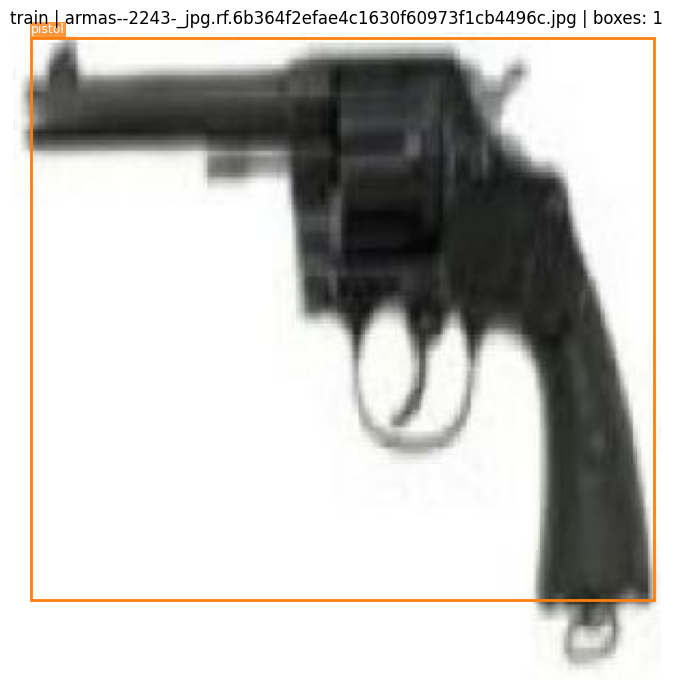

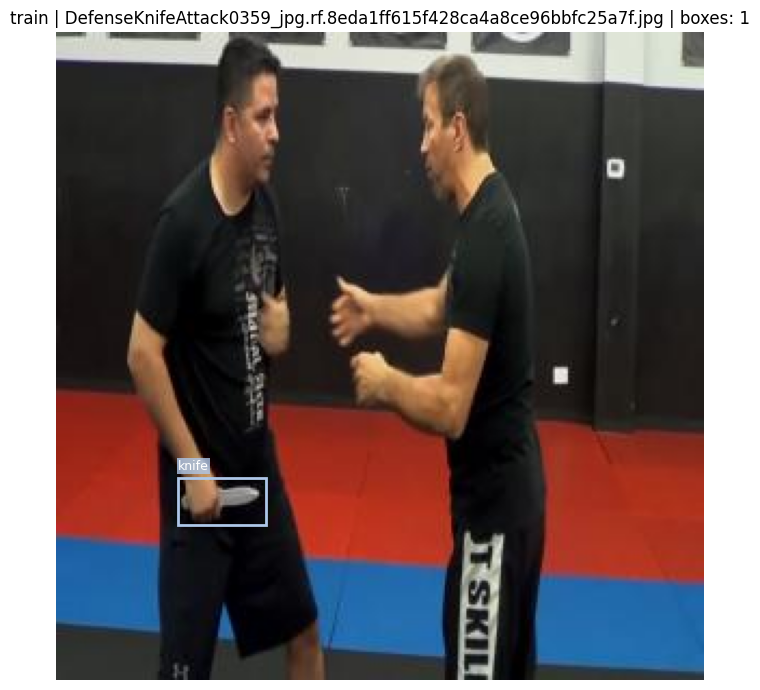

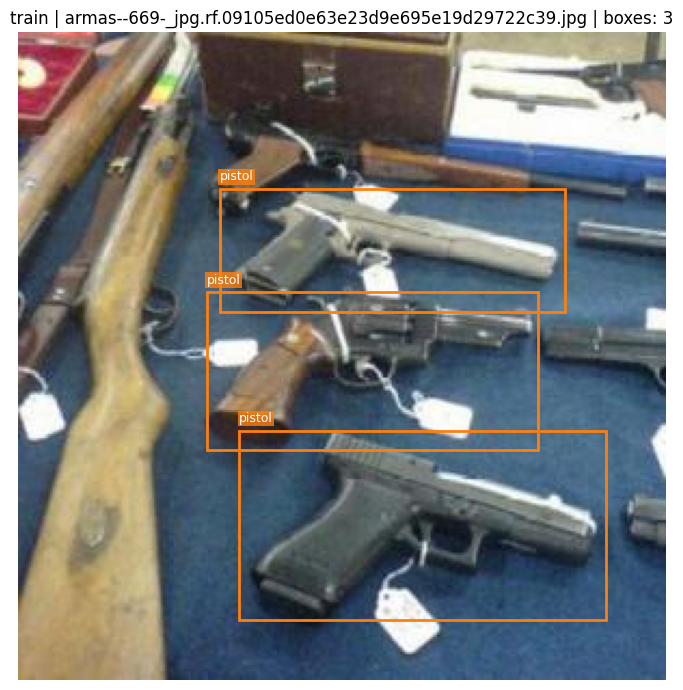

In [5]:
def show_random_image_with_boxes(only_with_annotations=True):
    candidate_ids = [
        img_id
        for img_id in valid_image_ids
        if (len(anns_by_image_id[img_id]) > 0 if only_with_annotations else True)
    ]

    if not candidate_ids:
        raise ValueError("No hay imagenes validas para mostrar con la configuracion actual.")

    image_id = random.choice(candidate_ids)
    img_info = image_by_id[image_id]
    img_path = resolve_image_path(img_info)
    anns = anns_by_image_id[image_id]

    img = Image.open(img_path).convert("RGB")
    fig, ax = plt.subplots(1, 1, figsize=(10, 7))
    ax.imshow(img)

    cmap = plt.get_cmap("tab20")
    cat_ids_sorted = sorted(category_by_id.keys())
    color_by_cat_id = {cid: cmap(i % 20) for i, cid in enumerate(cat_ids_sorted)}

    for ann in anns:
        x, y, w, h = ann["bbox"]  # COCO usa [x, y, width, height]
        cls_id = ann["category_id"]
        cls_name = category_by_id.get(cls_id, str(cls_id))
        color = color_by_cat_id.get(cls_id, (1.0, 0.0, 0.0, 1.0))

        rect = plt.Rectangle(
            (x, y),
            w,
            h,
            fill=False,
            edgecolor=color,
            linewidth=2,
        )
        ax.add_patch(rect)
        ax.text(
            x,
            max(0, y - 4),
            cls_name,
            color="white",
            fontsize=9,
            bbox=dict(facecolor=color, alpha=0.8, pad=1, edgecolor="none"),
        )

    ax.set_title(f"{SPLIT} | {img_info['file_name']} | boxes: {len(anns)}")
    ax.axis("off")
    plt.tight_layout()
    plt.show()

for _ in range(3):
    show_random_image_with_boxes(only_with_annotations=True)

# Fine-tuning RF-DETR Medium (GPU)
Entrenaremos RF-DETR Medium con tu dataset local y validaremos metricas + pruebas en imagenes nuevas.

Nota importante:
- Tu dataset COCO local tiene 3 clases: weapon, knife, pistol.
- Tu dataset YOLO actual en este repo tiene 2 clases (knife, pistol).
- Para entrenar exactamente 3 clases, usaremos por defecto el dataset COCO.

In [6]:
import json
import random
import time
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image

from rfdetr import RFDETRMedium

PROJECT_ROOT = Path.cwd()

COCO_DATASET_DIR = PROJECT_ROOT / "guns-knives-coco" / "guns-knives-coco"
YOLO_DATASET_DIR = PROJECT_ROOT / "guns-knives-yolo" / "guns-knives-yolo"

# Usa "coco" para tus 3 clases: weapon, knife, pistol
DATASET_FORMAT = "coco"  # "coco" o "yolo"
DATASET_DIR = COCO_DATASET_DIR if DATASET_FORMAT == "coco" else YOLO_DATASET_DIR

EXPECTED_CLASSES = ["weapon", "knife", "pistol"]

RUN_NAME = f"rfdetr-medium-{DATASET_FORMAT}-{time.strftime('%Y%m%d-%H%M%S')}"
OUTPUT_DIR = PROJECT_ROOT / "runs" / RUN_NAME
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

EPOCHS = 30
BATCH_SIZE = 4
GRAD_ACCUM_STEPS = 4
NUM_WORKERS = 4
USE_RUN_TEST = True
CONF_THRESHOLD = 0.35

print("Torch:", torch.__version__)
print("CUDA disponible:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
print("DATASET_FORMAT:", DATASET_FORMAT)
print("DATASET_DIR:", DATASET_DIR)
print("OUTPUT_DIR:", OUTPUT_DIR)

Torch: 2.10.0+cu130
CUDA disponible: True
GPU: NVIDIA GeForce RTX 5050 Laptop GPU
DATASET_FORMAT: coco
DATASET_DIR: c:\Users\LENOVO\Documents\Stealth\guns-knives-coco\guns-knives-coco
OUTPUT_DIR: c:\Users\LENOVO\Documents\Stealth\runs\rfdetr-medium-coco-20260315-121931


In [7]:
if not DATASET_DIR.exists():
    raise FileNotFoundError(f"No existe DATASET_DIR: {DATASET_DIR}")

def get_coco_class_names(dataset_dir: Path):
    ann_path = dataset_dir / "train" / "_annotations.coco.json"
    if not ann_path.exists():
        raise FileNotFoundError(f"No existe anotacion COCO: {ann_path}")
    with open(ann_path, "r", encoding="utf-8") as f:
        coco_train = json.load(f)
    categories = sorted(coco_train.get("categories", []), key=lambda c: c["id"])
    return [c["name"] for c in categories]

def get_yolo_class_names(dataset_dir: Path):
    import yaml
    yaml_candidates = [dataset_dir / "data.yaml", dataset_dir / "data.yml"]
    yaml_path = next((p for p in yaml_candidates if p.exists()), None)
    if yaml_path is None:
        raise FileNotFoundError("No se encontro data.yaml/data.yml en dataset YOLO.")
    with open(yaml_path, "r", encoding="utf-8") as f:
        yolo_data = yaml.safe_load(f)
    names = yolo_data.get("names", [])
    if isinstance(names, dict):
        names = [names[k] for k in sorted(names.keys())]
    return [str(n) for n in names], yaml_path

if DATASET_FORMAT == "coco":
    class_names = get_coco_class_names(DATASET_DIR)
else:
    class_names, yaml_path = get_yolo_class_names(DATASET_DIR)
    print("YAML:", yaml_path)

print("Clases detectadas:", class_names)
print("Numero de clases:", len(class_names))

if DATASET_FORMAT == "coco" and class_names != EXPECTED_CLASSES:
    raise ValueError(
        f"Clases COCO inesperadas. Esperado={EXPECTED_CLASSES}, encontrado={class_names}"
    )

if DATASET_FORMAT == "yolo" and class_names != EXPECTED_CLASSES:
    print("AVISO: el dataset YOLO de este repo no coincide con 3 clases esperadas.")
    print("Para weapon/knife/pistol usa DATASET_FORMAT = 'coco'.")

dataset_file = "roboflow" if DATASET_FORMAT == "coco" else "yolo"
print("dataset_file para RF-DETR:", dataset_file)

Clases detectadas: ['weapon', 'knife', 'pistol']
Numero de clases: 3
dataset_file para RF-DETR: roboflow


In [8]:
model = RFDETRMedium()  # Medium preentrenado, luego fine-tune en tu dataset

train_kwargs = dict(
    dataset_dir=str(DATASET_DIR),
    dataset_file=dataset_file,
    output_dir=str(OUTPUT_DIR),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    grad_accum_steps=GRAD_ACCUM_STEPS,
    num_workers=NUM_WORKERS,
    lr=1e-4,
    lr_encoder=1.5e-4,
    weight_decay=1e-4,
    early_stopping=True,
    early_stopping_patience=10,
    eval_interval=1,
    run_test=USE_RUN_TEST,
    tensorboard=True,
    wandb=False,
    mlflow=False,
    clearml=False,
    project="stealth-rfdetr",
    run=RUN_NAME,
    class_names=EXPECTED_CLASSES,
)

print("Iniciando fine-tuning RF-DETR Medium...")
print(train_kwargs)

model.train(**train_kwargs)

best_ckpt_candidates = [
    OUTPUT_DIR / "checkpoint_best_total.pth",
    OUTPUT_DIR / "checkpoint_best_ema.pth",
    OUTPUT_DIR / "checkpoint_best_regular.pth",
]
BEST_CHECKPOINT = next((p for p in best_ckpt_candidates if p.exists()), None)

print("Entrenamiento finalizado.")
print("BEST_CHECKPOINT:", BEST_CHECKPOINT)
print("results.json:", OUTPUT_DIR / "results.json")
print("metrics_plot.png:", OUTPUT_DIR / "metrics_plot.png")

[2026-03-15 12:21:28] [INFO] rf-detr - File rf-detr-medium.pth already exists with correct MD5 hash.


[2026-03-15 12:21:28] [WARNING] rf-detr - Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
[2026-03-15 12:21:28] [WARNING] rf-detr - Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.


[2026-03-15 12:21:28] [INFO] rf-detr - Loading pretrain weights
[2026-03-15 12:21:29] [INFO] rf-detr - File rf-detr-medium.pth already exists with correct MD5 hash.


[2026-03-15 12:21:30] [WARNING] rf-detr - Reinitializing your detection head with 3 classes.
[2026-03-15 12:21:30] [WARNING] rf-detr - Unable to initialize TensorBoard. Logging is turned off for this session. Run 'pip install tensorboard' to enable logging.


Iniciando fine-tuning RF-DETR Medium...
{'dataset_dir': 'c:\\Users\\LENOVO\\Documents\\Stealth\\guns-knives-coco\\guns-knives-coco', 'dataset_file': 'roboflow', 'output_dir': 'c:\\Users\\LENOVO\\Documents\\Stealth\\runs\\rfdetr-medium-coco-20260315-121931', 'epochs': 30, 'batch_size': 4, 'grad_accum_steps': 4, 'num_workers': 4, 'lr': 0.0001, 'lr_encoder': 0.00015, 'weight_decay': 0.0001, 'early_stopping': True, 'early_stopping_patience': 10, 'eval_interval': 1, 'run_test': True, 'tensorboard': True, 'wandb': False, 'mlflow': False, 'clearml': False, 'project': 'stealth-rfdetr', 'run': 'rfdetr-medium-coco-20260315-121931', 'class_names': ['weapon', 'knife', 'pistol']}
[2026-03-15 12:21:30] [INFO] rf-detr - Not using distributed mode
[2026-03-15 12:21:30] [INFO] rf-detr - git:
  sha: 57a63fba7814776997a06f547fed91e70f302be7, status: has uncommitted changes, branch: main

[2026-03-15 12:21:30] [INFO] rf-detr - Namespace(num_classes=3, grad_accum_steps=4, print_freq=10, amp=True, lr=0.0001

[2026-03-15 12:30:32] [INFO] rf-detr - Test-ema  [  0/261]  eta: 1:23:30  class_error: 0.00  loss: 4.9666 (4.9666)  loss_ce: 0.5195 (0.5195)  loss_bbox: 0.1412 (0.1412)  loss_giou: 0.2277 (0.2277)  loss_ce_0: 0.6992 (0.6992)  loss_bbox_0: 0.1077 (0.1077)  loss_giou_0: 0.2201 (0.2201)  loss_ce_1: 0.5820 (0.5820)  loss_bbox_1: 0.1102 (0.1102)  loss_giou_1: 0.2328 (0.2328)  loss_ce_2: 0.5234 (0.5234)  loss_bbox_2: 0.1588 (0.1588)  loss_giou_2: 0.2317 (0.2317)  loss_ce_enc: 0.5508 (0.5508)  loss_bbox_enc: 0.3368 (0.3368)  loss_giou_enc: 0.3246 (0.3246)  loss_ce_unscaled: 0.5195 (0.5195)  class_error_unscaled: 0.0000 (0.0000)  loss_bbox_unscaled: 0.0282 (0.0282)  loss_giou_unscaled: 0.1138 (0.1138)  cardinality_error_unscaled: 262.7500 (262.7500)  loss_ce_0_unscaled: 0.6992 (0.6992)  loss_bbox_0_unscaled: 0.0215 (0.0215)  loss_giou_0_unscaled: 0.1100 (0.1100)  cardinality_error_0_unscaled: 223.5000 (223.5000)  loss_ce_1_unscaled: 0.5820 (0.5820)  loss_bbox_1_unscaled: 0.0220 (0.0220)  loss_

In [9]:
log_path = OUTPUT_DIR / "log.txt"
results_path = OUTPUT_DIR / "results.json"
plot_path = OUTPUT_DIR / "metrics_plot.png"

if not log_path.exists():
    raise FileNotFoundError(f"No existe log.txt en {log_path}. Ejecuta primero la celda de entrenamiento.")

log_entries = []
with open(log_path, "r", encoding="utf-8") as f:
    for line in f:
        line = line.strip()
        if line:
            log_entries.append(json.loads(line))

print("Registros de entrenamiento:", len(log_entries))
if not log_entries:
    raise ValueError("log.txt esta vacio")

def pick_metric(entries, key, idx=None):
    values = []
    for e in entries:
        v = e.get(key, np.nan)
        if idx is not None:
            if isinstance(v, list) and len(v) > idx:
                values.append(v[idx])
            else:
                values.append(np.nan)
        else:
            values.append(v)
    return np.array(values, dtype=float)

epochs = pick_metric(log_entries, "epoch")
train_loss = pick_metric(log_entries, "train_loss")
valid_loss = pick_metric(log_entries, "test_loss")
map50_95_valid = pick_metric(log_entries, "test_coco_eval_bbox", 0)
map50_valid = pick_metric(log_entries, "test_coco_eval_bbox", 1)
ar50_95_valid = pick_metric(log_entries, "test_coco_eval_bbox", 8)

ema_map50_95_valid = pick_metric(log_entries, "ema_test_coco_eval_bbox", 0)
ema_map50_valid = pick_metric(log_entries, "ema_test_coco_eval_bbox", 1)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].plot(epochs, train_loss, label="train_loss")
axes[0].plot(epochs, valid_loss, label="valid_loss")
axes[0].set_title("Loss")
axes[0].set_xlabel("epoch")
axes[0].grid(True)
axes[0].legend()

axes[1].plot(epochs, map50_95_valid, label="mAP50-95 valid")
axes[1].plot(epochs, map50_valid, label="mAP50 valid")
if not np.isnan(ema_map50_95_valid).all():
    axes[1].plot(epochs, ema_map50_95_valid, label="EMA mAP50-95 valid")
if not np.isnan(ema_map50_valid).all():
    axes[1].plot(epochs, ema_map50_valid, label="EMA mAP50 valid")
axes[1].set_title("Detection metrics")
axes[1].set_xlabel("epoch")
axes[1].grid(True)
axes[1].legend()

plt.tight_layout()
plt.show()

if results_path.exists():
    with open(results_path, "r", encoding="utf-8") as f:
        results_json = json.load(f)
    print("class_map:")
    print(json.dumps(results_json.get("class_map", {}), indent=2))
else:
    print("results.json aun no existe")

print("metrics_plot.png existe:", plot_path.exists())

Registros de entrenamiento: 17
class_map:
{
  "valid": [
    {
      "class": "knife",
      "map@50:95": 0.7096782994295512,
      "map@50": 0.9602204608204362,
      "precision": 0.952054794520548,
      "recall": 0.9251247920133111,
      "f1_score": 0.9383966244725738
    },
    {
      "class": "pistol",
      "map@50:95": 0.8137153722356439,
      "map@50": 0.9704068393926192,
      "precision": 0.9734982332155477,
      "recall": 0.915282392026578,
      "f1_score": 0.9434931506849314
    },
    {
      "class": "all",
      "map@50:95": 0.7616968358325975,
      "map@50": 0.9653136501065276,
      "precision": 0.9627765138680479,
      "recall": 0.9202035920199445,
      "f1_score": 0.9409448875787526
    }
  ],
  "test": [
    {
      "class": "knife",
      "map@50:95": 0.7106970313684701,
      "map@50": 0.95818808538286,
      "precision": 0.9519230769230769,
      "recall": 0.9166666666666666,
      "f1_score": 0.9339622641509433
    },
    {
      "class": "pistol",
     

In [10]:
# Carga del mejor checkpoint para inferencia (si no existe en memoria)
if "BEST_CHECKPOINT" not in globals() or BEST_CHECKPOINT is None:
    best_ckpt_candidates = [
        OUTPUT_DIR / "checkpoint_best_total.pth",
        OUTPUT_DIR / "checkpoint_best_ema.pth",
        OUTPUT_DIR / "checkpoint_best_regular.pth",
    ]
    BEST_CHECKPOINT = next((p for p in best_ckpt_candidates if p.exists()), None)

if BEST_CHECKPOINT is None:
    raise FileNotFoundError(
        "No se encontro un checkpoint entrenado. Ejecuta primero la celda de entrenamiento."
    )

inference_model = RFDETRMedium(pretrain_weights=str(BEST_CHECKPOINT))
print("Checkpoint cargado:", BEST_CHECKPOINT)
print("class_names del modelo:", inference_model.class_names)

def list_candidate_images():
    exts = ("*.jpg", "*.jpeg", "*.png", "*.bmp", "*.webp")
    candidates = []

    # Imagenes nuevas manuales
    for ext in exts:
        candidates.extend((PROJECT_ROOT / "test_images").glob(ext))

    # Test del dataset (no visto durante train/valid)
    test_split = COCO_DATASET_DIR / "test"
    for ext in exts:
        candidates.extend(test_split.glob(ext))

    # Unicos y existentes
    uniq = []
    seen = set()
    for p in candidates:
        rp = p.resolve()
        if p.exists() and rp not in seen:
            seen.add(rp)
            uniq.append(p)
    return uniq

def draw_prediction(img_path: Path, det, class_map, max_boxes=50):
    img = Image.open(img_path).convert("RGB")
    arr = np.array(img)

    fig, ax = plt.subplots(1, 1, figsize=(10, 7))
    ax.imshow(arr)

    n = min(len(det), max_boxes)
    for i in range(n):
        x1, y1, x2, y2 = det.xyxy[i]
        cls_id = int(det.class_id[i])
        score = float(det.confidence[i])
        cls_name = class_map.get(cls_id, str(cls_id))

        rect = plt.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            fill=False,
            edgecolor="lime",
            linewidth=2,
        )
        ax.add_patch(rect)
        ax.text(
            x1,
            max(0, y1 - 4),
            f"{cls_name} {score:.2f}",
            color="black",
            fontsize=9,
            bbox=dict(facecolor="lime", alpha=0.9, pad=1, edgecolor="none"),
        )

    ax.set_title(f"{img_path.name} | detecciones: {len(det)}")
    ax.axis("off")
    plt.tight_layout()
    plt.show()

candidate_images = list_candidate_images()
print("Imagenes candidatas para prueba:", len(candidate_images))
if not candidate_images:
    raise FileNotFoundError(
        "No hay imagenes en test_images/ ni en guns-knives-coco/guns-knives-coco/test/."
    )

sample_images = random.sample(candidate_images, k=min(6, len(candidate_images)))
class_map = dict(inference_model.class_names)

for img_path in sample_images:
    detections = inference_model.predict(str(img_path), threshold=CONF_THRESHOLD)
    draw_prediction(img_path, detections, class_map)

[2026-03-15 15:27:00] [WARNING] rf-detr - Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
[2026-03-15 15:27:00] [WARNING] rf-detr - Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.


[2026-03-15 15:27:00] [INFO] rf-detr - Loading pretrain weights


[2026-03-15 15:27:00] [WARNING] rf-detr - Reinitializing detection head with 2 classes based on pretrained weights, configured for 90.
[2026-03-15 15:27:00] [WARNING] rf-detr - Model is not optimized for inference. Latency may be higher than expected. You can optimize the model for inference by calling model.optimize_for_inference().


Checkpoint cargado: c:\Users\LENOVO\Documents\Stealth\runs\rfdetr-medium-coco-20260315-121931\checkpoint_best_total.pth
class_names del modelo: {1: 'weapon', 2: 'knife', 3: 'pistol'}
Imagenes candidatas para prueba: 386


Imagen evaluada: c:\Users\LENOVO\Documents\Stealth\test_images\prueba2.jpg
Detecciones: 0


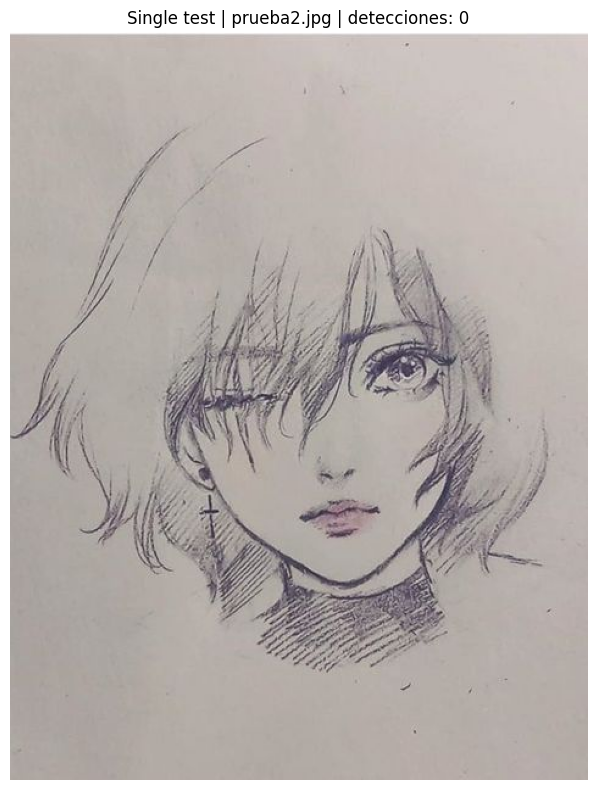

In [17]:
# Prueba puntual del modelo fine-tuneado con UNA imagen
IMAGE_TO_TEST = PROJECT_ROOT / "test_images" / "prueba2.jpg"  # Cambia este nombre/ruta
SINGLE_IMAGE_THRESHOLD = CONF_THRESHOLD

# Si no existe la imagen indicada, intenta tomar la primera imagen disponible en test_images
if not IMAGE_TO_TEST.exists():
    exts = ("*.jpg", "*.jpeg", "*.png", "*.bmp", "*.webp")
    fallback = []
    for ext in exts:
        fallback.extend((PROJECT_ROOT / "test_images").glob(ext))
    if fallback:
        IMAGE_TO_TEST = fallback[0]
        print("Imagen no encontrada. Usando fallback:", IMAGE_TO_TEST)
    else:
        raise FileNotFoundError(
            "No existe IMAGE_TO_TEST y no hay imagenes dentro de test_images/."
        )

# Cargar modelo si no esta en memoria
if "inference_model" not in globals() or inference_model is None:
    if "BEST_CHECKPOINT" not in globals() or BEST_CHECKPOINT is None:
        best_ckpt_candidates = [
            OUTPUT_DIR / "checkpoint_best_total.pth",
            OUTPUT_DIR / "checkpoint_best_ema.pth",
            OUTPUT_DIR / "checkpoint_best_regular.pth",
        ]
        BEST_CHECKPOINT = next((p for p in best_ckpt_candidates if p.exists()), None)

    if BEST_CHECKPOINT is None:
        raise FileNotFoundError(
            "No se encontro checkpoint. Ejecuta primero la celda de entrenamiento."
        )

    inference_model = RFDETRMedium(pretrain_weights=str(BEST_CHECKPOINT))
    print("Modelo cargado desde:", BEST_CHECKPOINT)

# Prediccion
detections = inference_model.predict(str(IMAGE_TO_TEST), threshold=SINGLE_IMAGE_THRESHOLD)
print("Imagen evaluada:", IMAGE_TO_TEST)
print("Detecciones:", len(detections))

# Mapeo robusto de clases (0-based y 1-based)
if "EXPECTED_CLASSES" in globals() and EXPECTED_CLASSES:
    class_map_0 = {i: n for i, n in enumerate(EXPECTED_CLASSES)}
    class_map_1 = {i + 1: n for i, n in enumerate(EXPECTED_CLASSES)}
else:
    class_map_0 = {}
    class_map_1 = dict(inference_model.class_names) if hasattr(inference_model, "class_names") else {}

img = Image.open(IMAGE_TO_TEST).convert("RGB")
arr = np.array(img)

fig, ax = plt.subplots(1, 1, figsize=(11, 8))
ax.imshow(arr)

for i in range(len(detections)):
    x1, y1, x2, y2 = detections.xyxy[i]
    cls_id = int(detections.class_id[i])
    score = float(detections.confidence[i])
    cls_name = class_map_0.get(cls_id, class_map_1.get(cls_id, str(cls_id)))

    rect = plt.Rectangle(
        (x1, y1),
        x2 - x1,
        y2 - y1,
        fill=False,
        edgecolor="lime",
        linewidth=2,
    )
    ax.add_patch(rect)
    ax.text(
        x1,
        max(0, y1 - 4),
        f"{cls_name} {score:.2f}",
        color="black",
        fontsize=9,
        bbox=dict(facecolor="lime", alpha=0.9, pad=1, edgecolor="none"),
    )

ax.set_title(f"Single test | {IMAGE_TO_TEST.name} | detecciones: {len(detections)}")
ax.axis("off")
plt.tight_layout()

try:
    from IPython.display import display
    display(fig)
    plt.close(fig)
except Exception:
    plt.show()

In [16]:
# Deteccion en tiempo real con webcam usando el modelo fine-tuneado
import cv2
import time
import torch
import numpy as np
from PIL import Image
from IPython.display import display, clear_output

CAMERA_INDEX = 0
WEBCAM_THRESHOLD = CONF_THRESHOLD
PROCESS_EVERY_N_FRAMES = 2  # Sube a 3 o 4 si quieres mas FPS
WINDOW_NAME = "RF-DETR Webcam (presiona q para salir)"
USE_DSHOW = True  # Recomendado en Windows
OPTIMIZE_INFERENCE = True
DISPLAY_SCALE = 1.0  # 1.0 = sin reescalar

# Si imshow no esta disponible (OpenCV headless), usa vista inline en notebook.
FORCE_INLINE_PREVIEW = False
INLINE_PREVIEW_MAX_SECONDS = 120

def has_highgui_support():
    try:
        test = np.zeros((8, 8, 3), dtype=np.uint8)
        cv2.imshow("__highgui_test__", test)
        cv2.waitKey(1)
        cv2.destroyWindow("__highgui_test__")
        return True
    except cv2.error:
        return False

# Cargar modelo si no esta en memoria
if "inference_model" not in globals() or inference_model is None:
    if "BEST_CHECKPOINT" not in globals() or BEST_CHECKPOINT is None:
        best_ckpt_candidates = [
            OUTPUT_DIR / "checkpoint_best_total.pth",
            OUTPUT_DIR / "checkpoint_best_ema.pth",
            OUTPUT_DIR / "checkpoint_best_regular.pth",
        ]
        BEST_CHECKPOINT = next((p for p in best_ckpt_candidates if p.exists()), None)

    if BEST_CHECKPOINT is None:
        raise FileNotFoundError(
            "No se encontro checkpoint. Ejecuta primero la celda de entrenamiento."
        )

    inference_model = RFDETRMedium(pretrain_weights=str(BEST_CHECKPOINT))
    print("Modelo cargado desde:", BEST_CHECKPOINT)

# Optimizar para inferencia en tiempo real (una sola vez)
if OPTIMIZE_INFERENCE and not globals().get("_rfdetr_webcam_optimized", False):
    try:
        inference_model.optimize_for_inference(compile=False, batch_size=1, dtype=torch.float32)
        _rfdetr_webcam_optimized = True
        print("Modelo optimizado para inferencia en tiempo real")
    except Exception as e:
        print("No se pudo optimizar, continuamos normal:", e)

# Mapa de clases
if "EXPECTED_CLASSES" in globals() and EXPECTED_CLASSES:
    class_map_0 = {i: n for i, n in enumerate(EXPECTED_CLASSES)}
    class_map_1 = {i + 1: n for i, n in enumerate(EXPECTED_CLASSES)}
else:
    class_map_0 = {}
    class_map_1 = dict(inference_model.class_names) if hasattr(inference_model, "class_names") else {}

# Abrir webcam
cap = cv2.VideoCapture(CAMERA_INDEX, cv2.CAP_DSHOW) if USE_DSHOW else cv2.VideoCapture(CAMERA_INDEX)
if not cap.isOpened() and USE_DSHOW:
    cap = cv2.VideoCapture(CAMERA_INDEX)

if not cap.isOpened():
    raise RuntimeError(f"No se pudo abrir la webcam en indice {CAMERA_INDEX}")

cap.set(cv2.CAP_PROP_FRAME_WIDTH, 1280)
cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 720)

highgui_ok = has_highgui_support() and not FORCE_INLINE_PREVIEW
if highgui_ok:
    print("Modo ventana OpenCV activo. Presiona 'q' para salir.")
else:
    print("OpenCV sin soporte de ventanas: usando vista inline en notebook.")
    print("Para detener: interrumpe la celda (Stop) o espera el tiempo maximo.")

last_detections = None
frame_idx = 0
prev_time = time.time()
start_time = time.time()

try:
    while True:
        ok, frame_bgr = cap.read()
        if not ok:
            print("No se pudo leer frame de la webcam")
            break

        frame_idx += 1

        # Para mejorar FPS, inferimos cada N frames y reutilizamos detecciones
        if frame_idx % max(1, PROCESS_EVERY_N_FRAMES) == 0 or last_detections is None:
            frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
            last_detections = inference_model.predict(frame_rgb, threshold=WEBCAM_THRESHOLD)

        detections = last_detections
        det_count = 0 if detections is None else len(detections)

        if detections is not None:
            for i in range(len(detections)):
                x1, y1, x2, y2 = detections.xyxy[i]
                cls_id = int(detections.class_id[i])
                score = float(detections.confidence[i])
                cls_name = class_map_0.get(cls_id, class_map_1.get(cls_id, str(cls_id)))

                p1 = (int(x1), int(y1))
                p2 = (int(x2), int(y2))
                cv2.rectangle(frame_bgr, p1, p2, (0, 255, 0), 2)
                cv2.putText(
                    frame_bgr,
                    f"{cls_name} {score:.2f}",
                    (p1[0], max(20, p1[1] - 6)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    (0, 255, 0),
                    2,
                    cv2.LINE_AA,
                )

        now = time.time()
        fps = 1.0 / max(1e-6, now - prev_time)
        prev_time = now

        cv2.putText(
            frame_bgr,
            f"FPS: {fps:.1f} | Detecciones: {det_count}",
            (10, 28),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            (0, 255, 255),
            2,
            cv2.LINE_AA,
        )

        if DISPLAY_SCALE != 1.0:
            frame_show = cv2.resize(
                frame_bgr,
                None,
                fx=DISPLAY_SCALE,
                fy=DISPLAY_SCALE,
                interpolation=cv2.INTER_AREA,
            )
        else:
            frame_show = frame_bgr

        if highgui_ok:
            cv2.imshow(WINDOW_NAME, frame_show)
            key = cv2.waitKey(1) & 0xFF
            if key == ord("q"):
                break
        else:
            frame_rgb_show = cv2.cvtColor(frame_show, cv2.COLOR_BGR2RGB)
            clear_output(wait=True)
            display(Image.fromarray(frame_rgb_show))
            if (time.time() - start_time) >= INLINE_PREVIEW_MAX_SECONDS:
                print("Tiempo maximo inline alcanzado, cerrando webcam.")
                break
finally:
    cap.release()
    if highgui_ok:
        try:
            cv2.destroyAllWindows()
        except cv2.error:
            pass
    clear_output(wait=True)
    print("Webcam cerrada")

Webcam cerrada


In [19]:
# Inferencia sobre VIDEO cargado (archivo) con el modelo fine-tuneado
import cv2
import time
from IPython.display import Video, display, clear_output
from pathlib import Path

VIDEO_TO_TEST = PROJECT_ROOT / "test_videos" / "video2.mp4"  # Cambia esta ruta
VIDEO_THRESHOLD = CONF_THRESHOLD
VIDEO_PROCESS_EVERY_N_FRAMES = 1  # Sube a 2 o 3 para acelerar
SAVE_ANNOTATED_VIDEO = True
SHOW_PREVIEW_INLINE = True
PREVIEW_EVERY_N_FRAMES = 15

# Resolver video de entrada
if not VIDEO_TO_TEST.exists():
    video_exts = ("*.mp4", "*.avi", "*.mov", "*.mkv", "*.webm")
    fallback_videos = []
    for ext in video_exts:
        fallback_videos.extend((PROJECT_ROOT / "test_videos").glob(ext))
    if fallback_videos:
        VIDEO_TO_TEST = fallback_videos[0]
        print("Video no encontrado. Usando fallback:", VIDEO_TO_TEST)
    else:
        raise FileNotFoundError(
            "No existe VIDEO_TO_TEST y no hay videos dentro de test_videos/."
        )

# Cargar modelo si no esta en memoria
if "inference_model" not in globals() or inference_model is None:
    if "BEST_CHECKPOINT" not in globals() or BEST_CHECKPOINT is None:
        best_ckpt_candidates = [
            OUTPUT_DIR / "checkpoint_best_total.pth",
            OUTPUT_DIR / "checkpoint_best_ema.pth",
            OUTPUT_DIR / "checkpoint_best_regular.pth",
        ]
        BEST_CHECKPOINT = next((p for p in best_ckpt_candidates if p.exists()), None)

    if BEST_CHECKPOINT is None:
        raise FileNotFoundError(
            "No se encontro checkpoint. Ejecuta primero la celda de entrenamiento."
        )

    inference_model = RFDETRMedium(pretrain_weights=str(BEST_CHECKPOINT))
    print("Modelo cargado desde:", BEST_CHECKPOINT)

# Mapa de clases
if "EXPECTED_CLASSES" in globals() and EXPECTED_CLASSES:
    class_map_0 = {i: n for i, n in enumerate(EXPECTED_CLASSES)}
    class_map_1 = {i + 1: n for i, n in enumerate(EXPECTED_CLASSES)}
else:
    class_map_0 = {}
    class_map_1 = dict(inference_model.class_names) if hasattr(inference_model, "class_names") else {}

# Abrir video
cap = cv2.VideoCapture(str(VIDEO_TO_TEST))
if not cap.isOpened():
    raise RuntimeError(f"No se pudo abrir el video: {VIDEO_TO_TEST}")

src_fps = cap.get(cv2.CAP_PROP_FPS)
if src_fps is None or src_fps <= 0:
    src_fps = 30.0

width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

VIDEO_OUTPUT_PATH = OUTPUT_DIR / f"video_detected_{VIDEO_TO_TEST.stem}.mp4"
VIDEO_OUTPUT_PATH.parent.mkdir(parents=True, exist_ok=True)

writer = None
if SAVE_ANNOTATED_VIDEO:
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    writer = cv2.VideoWriter(str(VIDEO_OUTPUT_PATH), fourcc, src_fps, (width, height))
    if not writer.isOpened():
        raise RuntimeError(f"No se pudo crear video de salida: {VIDEO_OUTPUT_PATH}")

frame_idx = 0
last_detections = None
start = time.time()

print("Procesando video:", VIDEO_TO_TEST)
print("Resolucion:", (width, height), "| FPS:", round(src_fps, 2), "| Frames:", total_frames)

try:
    while True:
        ok, frame_bgr = cap.read()
        if not ok:
            break

        frame_idx += 1

        if frame_idx % max(1, VIDEO_PROCESS_EVERY_N_FRAMES) == 0 or last_detections is None:
            frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
            last_detections = inference_model.predict(frame_rgb, threshold=VIDEO_THRESHOLD)

        detections = last_detections

        if detections is not None:
            for i in range(len(detections)):
                x1, y1, x2, y2 = detections.xyxy[i]
                cls_id = int(detections.class_id[i])
                score = float(detections.confidence[i])
                cls_name = class_map_0.get(cls_id, class_map_1.get(cls_id, str(cls_id)))

                p1 = (int(x1), int(y1))
                p2 = (int(x2), int(y2))
                cv2.rectangle(frame_bgr, p1, p2, (0, 255, 0), 2)
                cv2.putText(
                    frame_bgr,
                    f"{cls_name} {score:.2f}",
                    (p1[0], max(20, p1[1] - 6)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    (0, 255, 0),
                    2,
                    cv2.LINE_AA,
                )

        # Overlay de progreso
        elapsed = max(1e-6, time.time() - start)
        proc_fps = frame_idx / elapsed
        cv2.putText(
            frame_bgr,
            f"Frame {frame_idx}/{total_frames if total_frames > 0 else '?'} | ProcFPS {proc_fps:.1f}",
            (10, 28),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.75,
            (0, 255, 255),
            2,
            cv2.LINE_AA,
        )

        if writer is not None:
            writer.write(frame_bgr)

        if SHOW_PREVIEW_INLINE and frame_idx % max(1, PREVIEW_EVERY_N_FRAMES) == 0:
            preview_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
            clear_output(wait=True)
            print(f"Procesando frame {frame_idx}/{total_frames if total_frames > 0 else '?'}")
            display(Image.fromarray(preview_rgb))
finally:
    cap.release()
    if writer is not None:
        writer.release()

clear_output(wait=True)
elapsed_total = time.time() - start
print("Procesamiento finalizado")
print("Frames procesados:", frame_idx)
print("Tiempo total (s):", round(elapsed_total, 2))
print("FPS promedio de proceso:", round(frame_idx / max(1e-6, elapsed_total), 2))

if SAVE_ANNOTATED_VIDEO:
    print("Video de salida:", VIDEO_OUTPUT_PATH)
    display(Video(str(VIDEO_OUTPUT_PATH), embed=True))

Procesamiento finalizado
Frames procesados: 623
Tiempo total (s): 21.21
FPS promedio de proceso: 29.37
Video de salida: c:\Users\LENOVO\Documents\Stealth\runs\rfdetr-medium-coco-20260315-121931\video_detected_video2.mp4


In [ ]:
# Export opcional del modelo fine-tune a ONNX
EXPORT_ONNX = False

if EXPORT_ONNX:
    if BEST_CHECKPOINT is None:
        raise FileNotFoundError("No hay checkpoint para exportar")

    export_dir = OUTPUT_DIR / "onnx"
    export_dir.mkdir(parents=True, exist_ok=True)

    export_model = RFDETRMedium(pretrain_weights=str(BEST_CHECKPOINT))
    export_model.export(output_dir=str(export_dir), simplify=True)
    print("Export finalizado en:", export_dir)
else:
    print("EXPORT_ONNX=False, export omitido")